In [1]:
import numpy as np
import matplotlib.pyplot as plt

import torch
from torchvision.datasets import ImageFolder
from torchvision import transforms, datasets
from torch.utils.data import DataLoader

import torch.nn as nn
import torch.nn.functional as F
from torch import optim

from PIL import Image


In [11]:
GANtype = 'DCGAN_Relu'

In [2]:
#学習設定

epochs = 401 # 学習回数
interval = 20  # 経過の表示間隔
batch_size = 64

In [3]:
#データセットの作成
#設定

img_size = 128  # 入力画像の高さと幅
n_noise = 64  # ノイズの数

transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),  # サイズの変更
    #transforms.RandomCrop(img_size),  # ランダムに切り抜き
    transforms.RandomHorizontalFlip(),  # ランダムに左右反転
    #transforms.RandomRotation(1),    # ランダムに少しだけ回転
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))  # -1から1の範囲にする
])

# データセットの設定
pets_datasets = datasets.ImageFolder(
    root= "./data", 
    transform=transform
    )
print("画像の枚数:", len(pets_datasets))

# DataLoaderの設定
train_loader = DataLoader(pets_datasets, 
                          batch_size=batch_size,
                          shuffle=True,
                           num_workers=2
                          )

画像の枚数: 10124


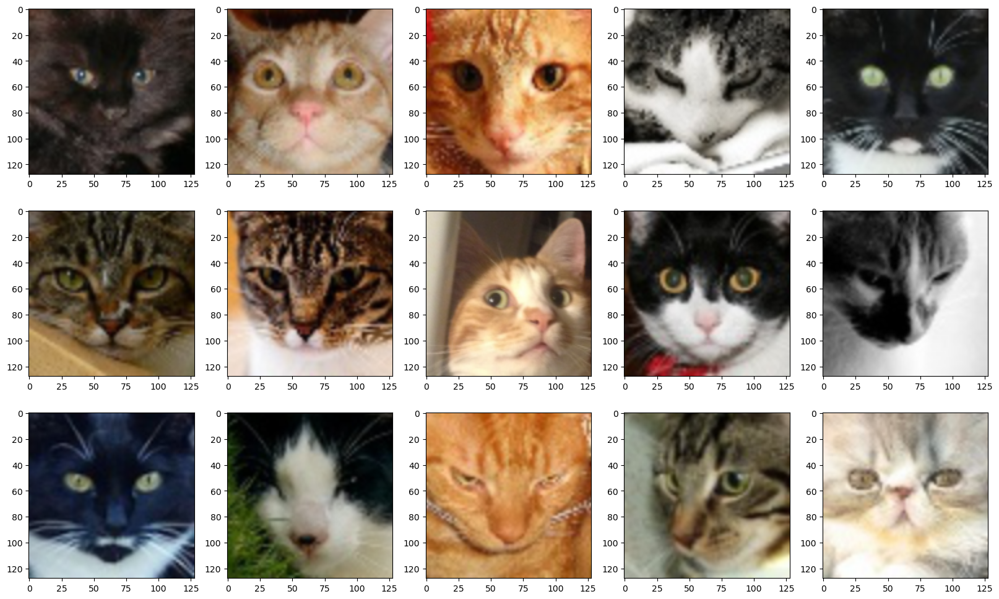

In [4]:
#画像データ確認
image = iter(train_loader).next()[0]
image = image.cpu().detach().numpy().transpose(0, 2, 3, 1)  # (バッチ、行、列、チャンネル)に変更
image = image/2+0.5  # 0-1の範囲に

rows = 3  # 行数
columns = 5  # 列数
scale = 4  # 表示スケール
plt.figure(figsize=(scale*columns, scale*rows))

for i in range(rows*columns):
    ax = plt.subplot(rows, columns, i+1)
    plt.imshow(image[i])
plt.show()

In [10]:
class Generator(nn.Module):
    def __init__(self):
        super().__init__()
        self.layers = nn.ModuleList([
            # 画像サイズ 1x1→4x4
            nn.ConvTranspose2d(n_noise, 512, 4, 1, 0),  # 入力のチャンネル数, 出力のチャンネル数, カーネルのサイズ、ストライド、パディング
            nn.BatchNorm2d(512),
            nn.ReLU(),
            # 画像サイズ 4x4→8x8
            nn.ConvTranspose2d(512, 256, 4, 2, 1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            # 画像サイズ 8x8→16x16
            nn.ConvTranspose2d(256, 128, 4, 2, 1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            # 画像サイズ 16x16→32x32
            nn.ConvTranspose2d(128, 64, 4, 2, 1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
           # 画像サイズ 32x32→64x64
            nn.ConvTranspose2d(64, 32, 4, 2, 1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            # 画像サイズ 64x64→128x128
            nn.ConvTranspose2d(32, 3, 4, 2, 1),
            nn.Tanh(),
        ])

    def forward(self, x):
        x = x.view(-1, n_noise, 1, 1)  # (バッチサイズ, チャンネル数, 高さ, 幅)
        for layer in self.layers:
            x = layer(x)
        return x

generator = Generator()
generator.cuda()  # GPU対応
print(generator)

Generator(
  (layers): ModuleList(
    (0): ConvTranspose2d(64, 512, kernel_size=(4, 4), stride=(1, 1))
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU()
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU()
    (12): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (13): BatchNorm2d(32, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (14): ReLU()
    (15): ConvTranspos

In [6]:
class Discriminator(nn.Module):
    def __init__(self):
        super().__init__()

        self.layers = nn.ModuleList([
            # 画像サイズ 128x128→64x64
            nn.Conv2d(3, 32, 4, 2, 1),  # 入力のチャンネル数, 出力のチャンネル数, カーネルのサイズ
            nn.LeakyReLU(negative_slope=0.2),
            # 画像サイズ 64x64→32x32
            nn.Conv2d(32, 64, 4, 2, 1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(negative_slope=0.2),
            # 画像サイズ 32x32→16x16
            nn.Conv2d(64, 128, 4, 2, 1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(negative_slope=0.2),
            # 画像サイズ 16x16→8x8
            nn.Conv2d(128, 256, 4, 2, 1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(negative_slope=0.2),
           # 画像サイズ 8x8→4x4
            nn.Conv2d(256, 512, 4, 2, 1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(negative_slope=0.2),
            # 画像サイズ 4x4→1x1
            nn.Conv2d(512, 1, 4, 1, 0),
            nn.Sigmoid(),
        ])

    def forward(self, x):
        x = x.view(-1, 3, img_size, img_size)  # (バッチサイズ, チャンネル数, 高さ, 幅)
        for layer in self.layers:
            x = layer(x)
        x = x.view(-1, 1)  # (バッチサイズ, 出力の数)
        return x

    
discriminator = Discriminator()
discriminator.cuda()  # GPU対応
print(discriminator)

Discriminator(
  (layers): ModuleList(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2)
    (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2)
    (5): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2)
    (8): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2)
    (11): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (12): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): LeakyReLU(negative_slope=0.2)
    (14): Conv2d(512, 1,

In [7]:
#学習中の画像確認用

def generate_images(i):
    # 画像の生成
    n_rows = 4  # 行数
    n_cols = 4  # 列数
    noise = torch.randn(n_rows * n_cols, n_noise).cuda()
    g_imgs = generator(noise)
    g_imgs = g_imgs/2 + 0.5  # 0-1の範囲にする
    g_imgs = g_imgs.cpu().detach().numpy()

    img_size_spaced = img_size + 0
    matrix_image = np.zeros((img_size_spaced*n_rows, img_size_spaced*n_cols, 3))  # 全体の画像

    #  生成された画像を並べて一枚の画像にする
    for r in range(n_rows):
        for c in range(n_cols):
            g_img = g_imgs[r*n_cols + c].transpose(1, 2, 0).reshape(img_size, img_size, 3)
            top = r*img_size_spaced
            left = c*img_size_spaced
            matrix_image[top : top+img_size, left : left+img_size, :] = g_img

    plt.figure(figsize=(8, 8))
    plt.imshow(matrix_image, vmin=0.0, vmax=1.0)
    plt.tick_params(labelbottom=False, labelleft=False, bottom=False, left=False)  # 軸目盛りのラベルと線を消す
    plt.show()

In [8]:
def count_correct(y, t):
    correct = torch.sum((torch.where(y<0.5, 0, 1) ==  t).float())
    return correct.item()

Epochs: 0
Epochs: 0
Error_fake: 0.2505592724085791 Acc_fake: 0.9065586724614777
Error_real: 0.2486654076514379 Acc_real: 0.9000395100750691


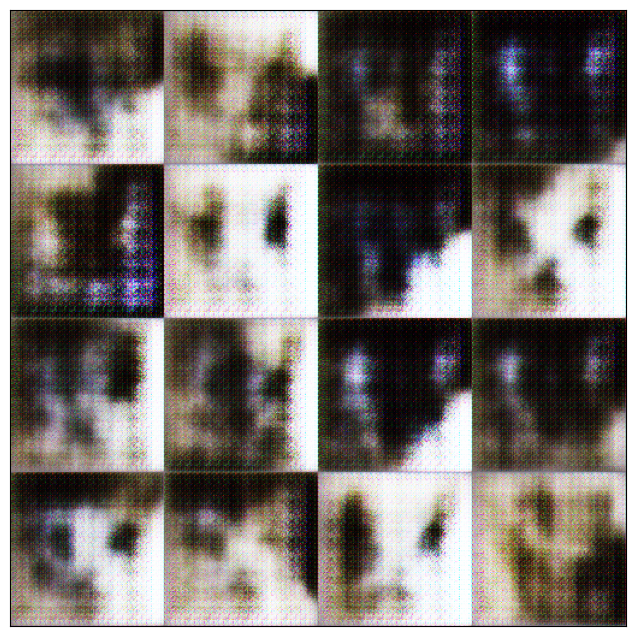

Epochs: 1
Epochs: 2
Epochs: 3
Epochs: 4
Epochs: 5
Epochs: 6
Epochs: 7
Epochs: 8
Epochs: 9
Epochs: 10
Epochs: 11
Epochs: 12
Epochs: 13
Epochs: 14
Epochs: 15
Epochs: 16
Epochs: 17
Epochs: 18
Epochs: 19
Epochs: 20
Epochs: 20
Error_fake: 0.0728170145313101 Acc_fake: 0.9828131173449229
Error_real: 0.09980401994843127 Acc_real: 0.9747135519557487


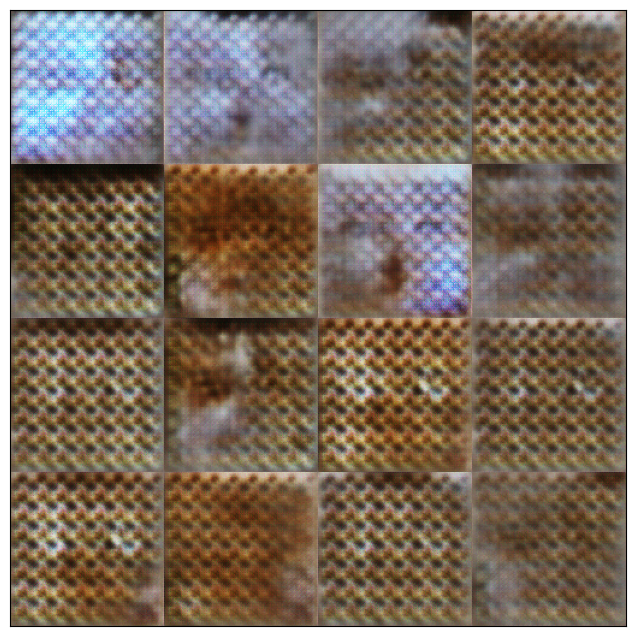

Epochs: 21
Epochs: 22
Epochs: 23
Epochs: 24
Epochs: 25
Epochs: 26
Epochs: 27
Epochs: 28
Epochs: 29
Epochs: 30
Epochs: 31
Epochs: 32
Epochs: 33
Epochs: 34
Epochs: 35
Epochs: 36
Epochs: 37
Epochs: 38
Epochs: 39
Epochs: 40
Epochs: 40
Error_fake: 0.027132901456792775 Acc_fake: 0.9969379691821414
Error_real: 0.03331515118166725 Acc_real: 0.99032003160806


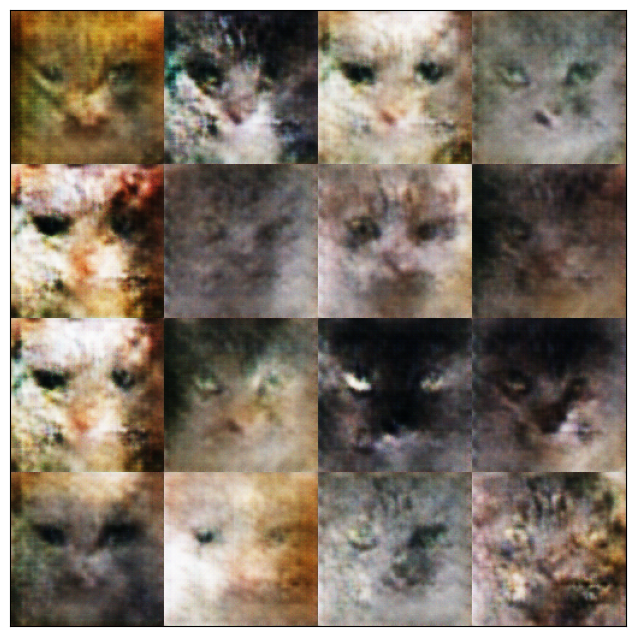

Epochs: 41
Epochs: 42
Epochs: 43
Epochs: 44
Epochs: 45
Epochs: 46
Epochs: 47
Epochs: 48
Epochs: 49
Epochs: 50
Epochs: 51
Epochs: 52
Epochs: 53
Epochs: 54
Epochs: 55
Epochs: 56
Epochs: 57
Epochs: 58
Epochs: 59
Epochs: 60
Epochs: 60
Error_fake: 0.030481419399466348 Acc_fake: 0.9948636902410115
Error_real: 0.033071060380136956 Acc_real: 0.9902212564203872


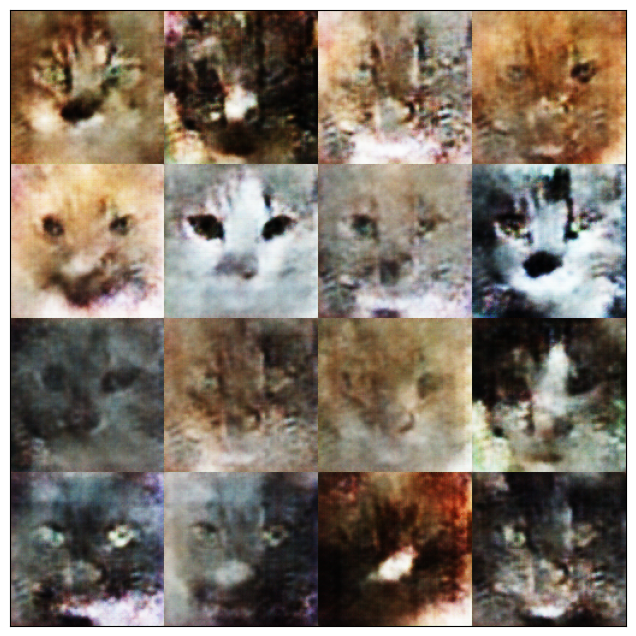

Epochs: 61
Epochs: 62
Epochs: 63
Epochs: 64
Epochs: 65
Epochs: 66
Epochs: 67
Epochs: 68
Epochs: 69
Epochs: 70
Epochs: 71
Epochs: 72
Epochs: 73
Epochs: 74
Epochs: 75
Epochs: 76
Epochs: 77
Epochs: 78
Epochs: 79
Epochs: 80
Epochs: 80
Error_fake: 0.025192075796577177 Acc_fake: 0.99239431054919
Error_real: 0.03059593203045454 Acc_real: 0.99032003160806


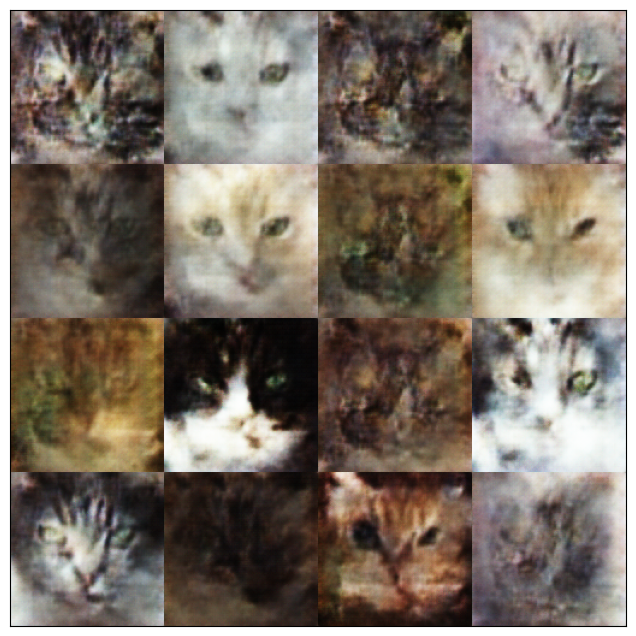

Epochs: 81
Epochs: 82
Epochs: 83
Epochs: 84
Epochs: 85
Epochs: 86
Epochs: 87
Epochs: 88
Epochs: 89
Epochs: 90
Epochs: 91
Epochs: 92
Epochs: 93
Epochs: 94
Epochs: 95
Epochs: 96
Epochs: 97
Epochs: 98
Epochs: 99
Epochs: 100
Epochs: 100
Error_fake: 0.012918471778159428 Acc_fake: 0.9976293954958514
Error_real: 0.017080663349096647 Acc_real: 0.9959502173054129


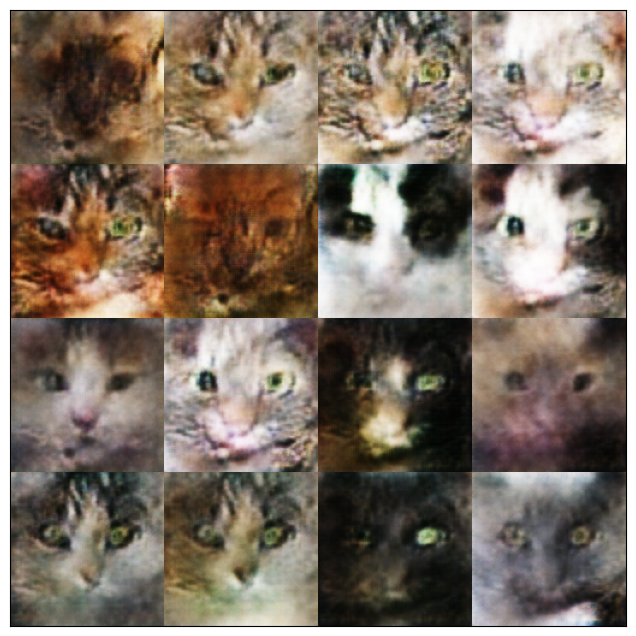

Epochs: 101
Epochs: 102
Epochs: 103
Epochs: 104
Epochs: 105
Epochs: 106
Epochs: 107
Epochs: 108
Epochs: 109
Epochs: 110
Epochs: 111
Epochs: 112
Epochs: 113
Epochs: 114
Epochs: 115
Epochs: 116
Epochs: 117
Epochs: 118
Epochs: 119
Epochs: 120
Epochs: 120
Error_fake: 0.010343920725211795 Acc_fake: 0.9987159225602529
Error_real: 0.01212644163827909 Acc_real: 0.99723429474516


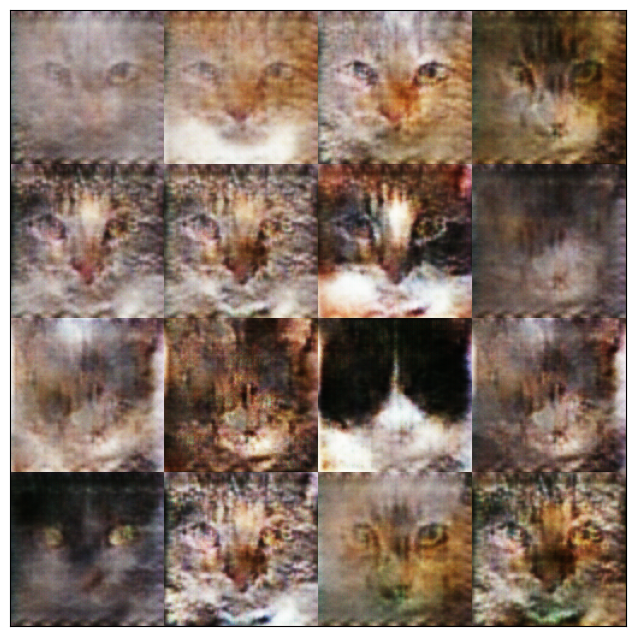

Epochs: 121
Epochs: 122
Epochs: 123
Epochs: 124
Epochs: 125
Epochs: 126
Epochs: 127
Epochs: 128
Epochs: 129
Epochs: 130
Epochs: 131
Epochs: 132
Epochs: 133
Epochs: 134
Epochs: 135
Epochs: 136
Epochs: 137
Epochs: 138
Epochs: 139
Epochs: 140
Epochs: 140
Error_fake: 0.0073146438470737835 Acc_fake: 0.99930857368629
Error_real: 0.008582618953021596 Acc_real: 0.9980244962465429


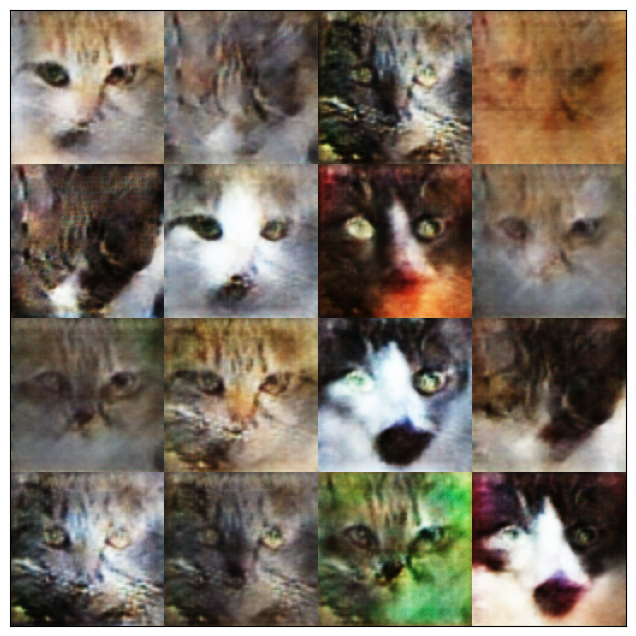

Epochs: 141
Epochs: 142
Epochs: 143
Epochs: 144
Epochs: 145
Epochs: 146
Epochs: 147
Epochs: 148
Epochs: 149
Epochs: 150
Epochs: 151
Epochs: 152
Epochs: 153
Epochs: 154
Epochs: 155
Epochs: 156
Epochs: 157
Epochs: 158
Epochs: 159
Epochs: 160
Epochs: 160
Error_fake: 0.007318086475815365 Acc_fake: 0.9987159225602529
Error_real: 0.008332870239822765 Acc_real: 0.99723429474516


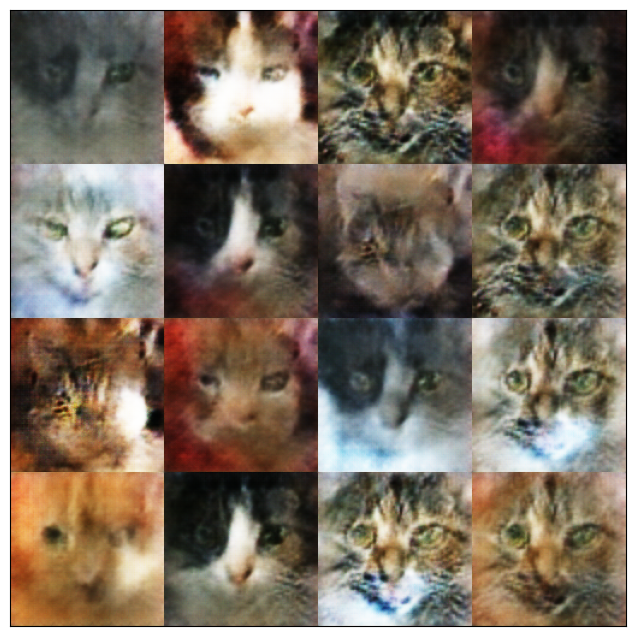

Epochs: 161
Epochs: 162
Epochs: 163
Epochs: 164
Epochs: 165
Epochs: 166
Epochs: 167
Epochs: 168
Epochs: 169
Epochs: 170
Epochs: 171
Epochs: 172
Epochs: 173
Epochs: 174
Epochs: 175
Epochs: 176
Epochs: 177
Epochs: 178
Epochs: 179
Epochs: 180
Epochs: 180
Error_fake: 0.0 Acc_fake: 1.0
Error_real: 2.5481102298240614e-06 Acc_real: 1.0


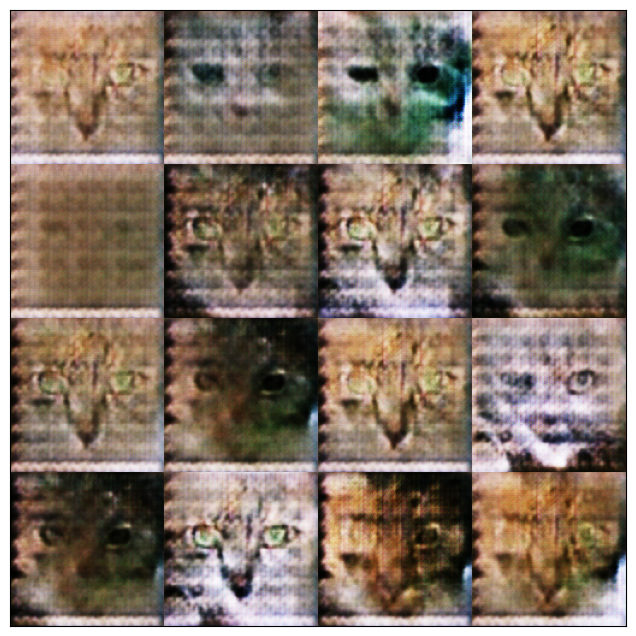

Epochs: 181
Epochs: 182
Epochs: 183
Epochs: 184
Epochs: 185
Epochs: 186
Epochs: 187
Epochs: 188
Epochs: 189
Epochs: 190
Epochs: 191
Epochs: 192
Epochs: 193
Epochs: 194
Epochs: 195
Epochs: 196
Epochs: 197
Epochs: 198
Epochs: 199
Epochs: 200
Epochs: 200
Error_fake: 0.0 Acc_fake: 1.0
Error_real: 1.5529922431332724e-07 Acc_real: 1.0


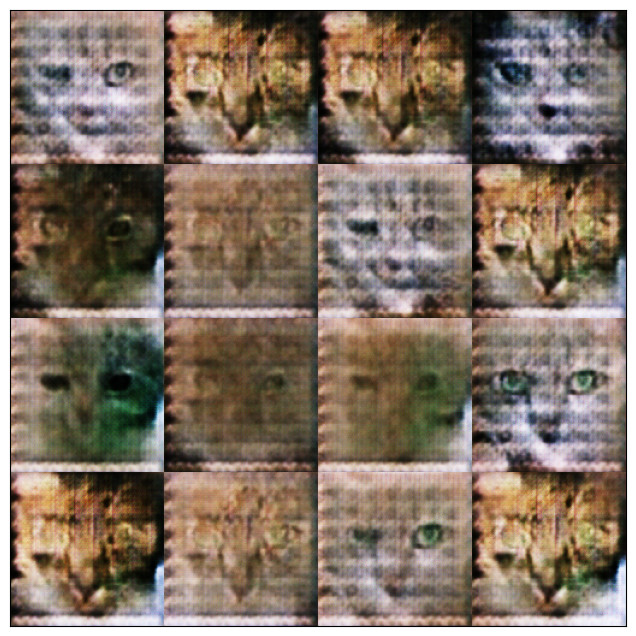

Epochs: 201
Epochs: 202


KeyboardInterrupt: 

In [9]:
# 二値の交差エントロピー誤差関数
loss_func = nn.BCELoss()

# Adam
optimizer_gen = optim.Adam(generator.parameters(), lr=0.0002)
optimizer_disc = optim.Adam(discriminator.parameters(), lr=0.00005)

# ログ
error_record_fake = []  # 偽物画像の誤差記録
acc_record_fake = []  # 偽物画像の精度記録
error_record_real = []  # 本物画像の誤差記録
acc_record_real = []  # 本物画像の精度記録

# 学習
generator.train()
discriminator.train()
for i in range(epochs):
    loss_fake = 0  # 誤差
    correct_fake = 0  # 正解数
    loss_real = 0
    correct_real = 0
    n_total = 0  # データの総数（精度の計算に使用）
    for j, (x,t) in enumerate(train_loader):  # ミニバッチ（x,）を取り出す

        n_total += x.size()[0]  # バッチサイズを累積

        # ノイズから画像を生成しDiscriminatorを訓練
        noise = torch.randn(x.size()[0], n_noise).cuda()
        imgs_fake = generator(noise)  # 画像の生成
        t = torch.zeros(x.size()[0], 1).cuda()  # 正解は0
        y = discriminator(imgs_fake)
        loss = loss_func(y, t)
        optimizer_disc.zero_grad()
        loss.backward()
        optimizer_disc.step()  # Discriminatorのみパラメータを更新
        loss_fake += loss.item()
        correct_fake += count_correct(y, t)

        # 本物の画像を使ってDiscriminatorを訓練
        imgs_real= x.cuda()
        t = torch.ones(x.size()[0], 1).cuda()  # 正解は1
        y = discriminator(imgs_real)
        loss = loss_func(y, t)
        optimizer_disc.zero_grad()
        loss.backward()
        optimizer_disc.step()  # Discriminatorのみパラメータを更新
        loss_real += loss.item()
        correct_real += count_correct(y, t)

        # Generatorを訓練
        noise = torch.randn(x.size()[0]*2, n_noise).cuda()  # バッチサイズを2倍にする
        imgs_fake = generator(noise)  # 画像の生成
        t = torch.ones(x.size()[0]*2, 1).cuda()  # 正解は1
        y = discriminator(imgs_fake)
        loss = loss_func(y, t)
        optimizer_gen.zero_grad()
        loss.backward()
        optimizer_gen.step()  # Generatorのみパラメータを更新

    loss_fake /= j+1  # 誤差
    error_record_fake.append(loss_fake)
    acc_fake = correct_fake / n_total  # 精度
    acc_record_fake.append(acc_fake)

    loss_real /= j+1  # 誤差
    error_record_real.append(loss_real)
    acc_real = correct_real / n_total  # 精度
    acc_record_real.append(acc_real)
    print ("Epochs:", i)

    # 一定間隔で誤差と精度、および生成された画像を表示
    if i % interval == 0:
        print ("Epochs:", i)
        print ("Error_fake:", loss_fake , "Acc_fake:", acc_fake)
        print ("Error_real:", loss_real , "Acc_real:", acc_real)
        generate_images(i)

In [10]:
generator.eval()
discriminator.eval()

Discriminator(
  (layers): ModuleList(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2)
    (2): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2)
    (5): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2)
    (8): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2)
    (11): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (12): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (13): LeakyReLU(negative_slope=0.2)
    (14): Conv2d(512, 1,

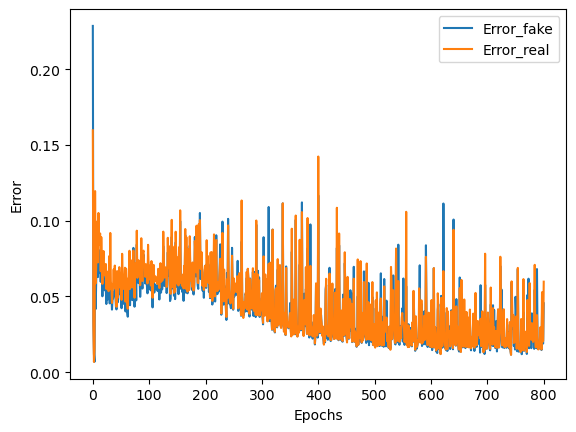

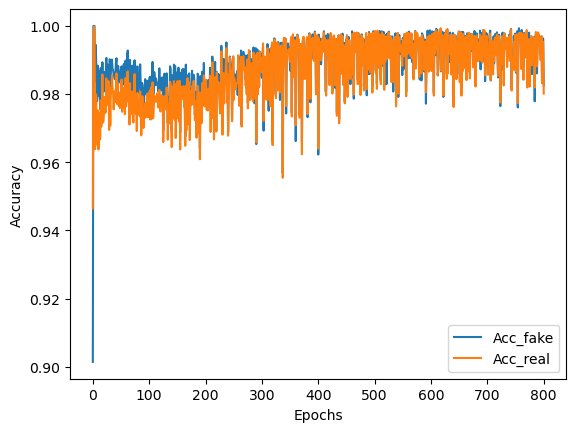

In [51]:
# 誤差と正解率の推移

# 誤差
plt.plot(range(len(error_record_fake)), error_record_fake, label="Error_fake")
plt.plot(range(len(error_record_real)), error_record_real, label="Error_real")
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Error")
plt.show()

# 正解率
plt.plot(range(len(acc_record_fake)), acc_record_fake, label="Acc_fake")
plt.plot(range(len(acc_record_real)), acc_record_real, label="Acc_real")
plt.legend()
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.show()

ErFake = np.array(error_record_fake)
ErReal = np.array(error_record_real)

AccFake = np.array(acc_record_fake)
AccReal = np.array(acc_record_real)


np.savetxt('ErrorFake-' + str(GANtype) + '.csv', ErFake, delimiter=',')
np.savetxt('ErrorReal-' + str(GANtype) + '.csv', ErReal, delimiter=',')
np.savetxt('AccFake-' + str(GANtype) + '.csv', AccFake, delimiter=',')
np.savetxt('AccReal-' + str(GANtype) + '.csv', AccReal, delimiter=',')


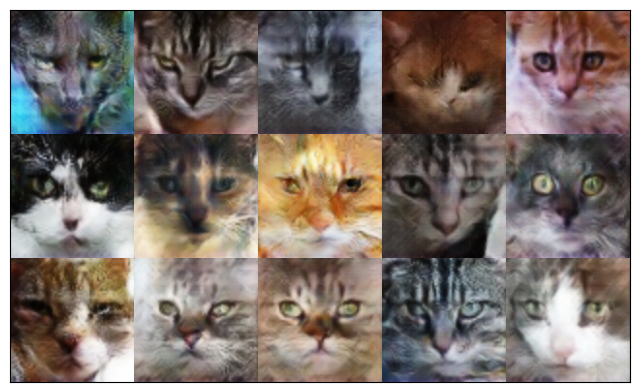

In [98]:
n_rows = 3  # 行数
n_cols = 5  # 列数
noise = torch.randn(n_rows * n_cols, n_noise).cuda()
g_imgs = generator(noise)
g_imgs = g_imgs/2 + 0.5  # 0-1の範囲にする
g_imgs = g_imgs.cpu().detach().numpy()

img_size_spaced = img_size + 0
matrix_image = np.zeros((img_size_spaced*n_rows, img_size_spaced*n_cols, 3))  # 全体の画像

#  生成された画像を並べて一枚の画像にする
for r in range(n_rows):
    for c in range(n_cols):
        g_img = g_imgs[r*n_cols + c].transpose(1, 2, 0).reshape(img_size, img_size, 3)
        top = r*img_size_spaced
        left = c*img_size_spaced
        matrix_image[top : top+img_size, left : left+img_size, :] = g_img

plt.figure(figsize=(8, 8))
plt.imshow(matrix_image, vmin=0.0, vmax=1.0)
plt.tick_params(labelbottom=False, labelleft=False, bottom=False, left=False)  # 軸目盛りのラベルと線を消す
plt.show()

    
IMG = 255 * matrix_image
pil_img = Image.fromarray(IMG.astype(np.uint8))
pil_img.save(str(GANtype) + '128.jpg')

In [101]:
model_path = 'model_' + str(GANtype) + '_G.pth'
torch.save(generator.state_dict(), model_path)

model_path = 'model_' + str(GANtype) + '_D.pth'
torch.save(discriminator.state_dict(), model_path)